<a href="https://colab.research.google.com/github/moienr/SEBAL/blob/main/sebal_Reflectance_Albedo_calculation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Comparing Albedo Drived from Landsat8 Collection 2 Level1 and Level2

**Class of Remote Sensing of Water, Soil and Vegetation - `Dr. Hamzeh`**

by: `Moien Rangzan`

# Calculating ALbedo for C2 Level 1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

import gdal
import rasterio

In [ ]:
if not (os.path.exists("/content/subset/")):
  !unzip '/content/drive/MyDrive/Colab Notebooks/SEBAL/subset.zip'
else:
  print('aleady unziped')

aleady unziped


## Calculating Albedo for Landsat8 C2L1

### importig the bands

In [ ]:
l1b2 = plt.imread('/content/subset/L1/LC08_L1TP_B2_cliped.tif')
l1b3 = plt.imread('/content/subset/L1/LC08_L1TP_B3_cliped.tif')
l1b4 = plt.imread('/content/subset/L1/LC08_L1TP_B4_cliped.tif')
l1b5 = plt.imread('/content/subset/L1/LC08_L1TP_B5_cliped.tif')
l1b6 = plt.imread('/content/subset/L1/LC08_L1TP_B6_cliped.tif')
l1b7 = plt.imread('/content/subset/L1/LC08_L1TP_B7_cliped.tif')

dem = rasterio.open('/content/drive/MyDrive/Colab Notebooks/SEBAL/aster_dem_subset.tif')


In [ ]:
dem =dem.read()
dem = dem[0]


In [ ]:
dem.shape

(327, 331)

In [ ]:
l1b2

array([[7799, 7869, 7886, ..., 8307, 8275, 8251],
       [7808, 8013, 8050, ..., 8313, 8250, 8274],
       [7975, 8232, 8242, ..., 8311, 8255, 8256],
       ...,
       [7832, 8059, 8169, ..., 7822, 7859, 7877],
       [8231, 8183, 8194, ..., 7857, 7881, 7752],
       [8232, 8169, 8183, ..., 7849, 7963, 7833]], dtype=uint16)

## Histogram Equalization


histogram stratching = https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html

https://github.com/computervisionpro/yt/blob/main/clahe/tutorial17.ipynb

unfortunalty this CLAHE stretching does not work on multi band images so should be appllied on each band separeaately - which gives wrong results since the contrast between each band will be lost and the images tends to be gray.
what we need to do is: we need to transform the image into HSV color space
and stretch the V (value - intesity) and leave the rest. this is how we get a good stretch

(310, 313, 3)


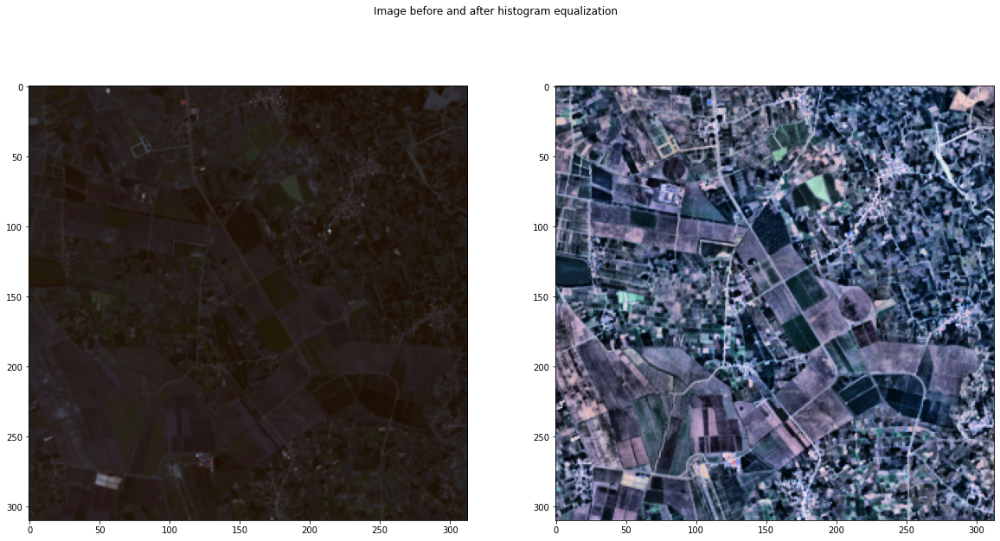

In [ ]:
def stack_3_channel(b1,b2,b3 , clipLimit = 40 ,  tileGridSize=(16,16) ):


  # b1 = (b1/np.max(b1))*255
  # b2 = (b2/np.max(b2))*255
  # b3 = (b3/np.max(b3))*255

  img = np.stack([b1,b2,b3], axis=2)
  img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

  hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
  h, s, v = hsv_img[:,:,0], hsv_img[:,:,1], hsv_img[:,:,2]



  clahe = cv.createCLAHE(clipLimit, tileGridSize)
  v = clahe.apply(v) #stretched histogram for showing the image with better contrast - its not ok to use it for scientific calculations

  hsv_img = np.dstack((h,s,v))

  rgb_stretched = cv.cvtColor(hsv_img, cv.COLOR_HSV2RGB)

  # img = img.astype('int32')

  return img , rgb_stretched


im , stretched = stack_3_channel(l1b2,l1b3,l1b4,clipLimit = 20 ,  tileGridSize=(16,16) )
print(stretched.shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('Image before and after histogram equalization')
ax1.imshow(im)
ax2.imshow(stretched)


## resampeloing the dem into the same pixel size as Landsat pixels

In [ ]:
dem = cv.resize(dem,(l1b2.shape[1],l1b2.shape[0]),cv.INTER_NEAREST)

In [ ]:
print(l1b2.shape,dem.shape)

(310, 313) (310, 313)


making Figures sizes bigger:

In [ ]:
plt.rcParams['figure.figsize'] = [20,10]

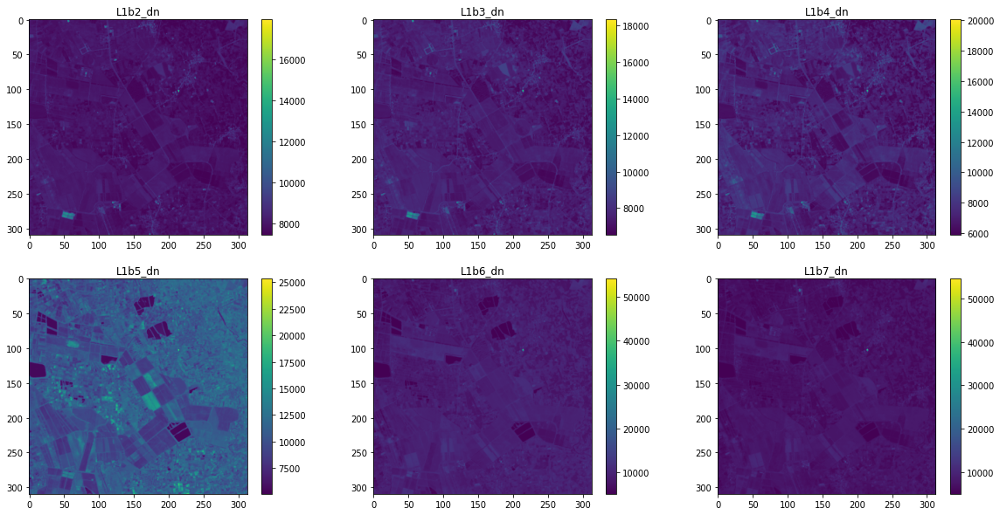

In [ ]:
l1_dns = [l1b2,l1b3,l1b4,l1b5,l1b6,l1b7]

fig, ax = plt.subplots(2, 3)
k = 0
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(l1_dns[k])
         ax[i, j].set_title('L1b' + str(k+2) + '_dn')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

## computing the radiance for each band

* Grescale (Gain) is found for each band from the RADIANCE_MULT_BAND_x field of the Landsat metadata file.
* Brescale (Bias) is found for each band from the RADIANCE_ADD_BAND_x field of the Landsat metadata file.

from the MLT file we have:


In [ ]:
RADIANCE_MULT_BAND_2 = 1.3159E-02
RADIANCE_MULT_BAND_3 = 1.2126E-02
RADIANCE_MULT_BAND_4 = 1.0225E-02
RADIANCE_MULT_BAND_5 = 6.2571E-03
RADIANCE_MULT_BAND_6 = 1.5561E-03
RADIANCE_MULT_BAND_7 = 5.2449E-04

RADIANCE_ADD_BAND_2 = -65.79296
RADIANCE_ADD_BAND_3 = -60.62765
RADIANCE_ADD_BAND_4 = -51.12465
RADIANCE_ADD_BAND_5 = -31.28574
RADIANCE_ADD_BAND_6 = -7.78048
RADIANCE_ADD_BAND_7 = -2.62244


### a function to calculate the radiance
$L_{\lambda}=($ Gain $\times D N)+$ Bias

In [ ]:
def dn2radiance(dn_raster,gain = 1, bias = 1):
  radiance = gain*dn_raster + bias
  return radiance

In [ ]:
l1b2_radiance = dn2radiance(l1b2,RADIANCE_MULT_BAND_2,RADIANCE_ADD_BAND_2)
l1b3_radiance = dn2radiance(l1b3,RADIANCE_MULT_BAND_3,RADIANCE_ADD_BAND_3)
l1b4_radiance = dn2radiance(l1b4,RADIANCE_MULT_BAND_4,RADIANCE_ADD_BAND_4)
l1b5_radiance = dn2radiance(l1b5,RADIANCE_MULT_BAND_5,RADIANCE_ADD_BAND_5)
l1b6_radiance = dn2radiance(l1b6,RADIANCE_MULT_BAND_6,RADIANCE_ADD_BAND_6)
l1b7_radiance = dn2radiance(l1b7,RADIANCE_MULT_BAND_7,RADIANCE_ADD_BAND_7)

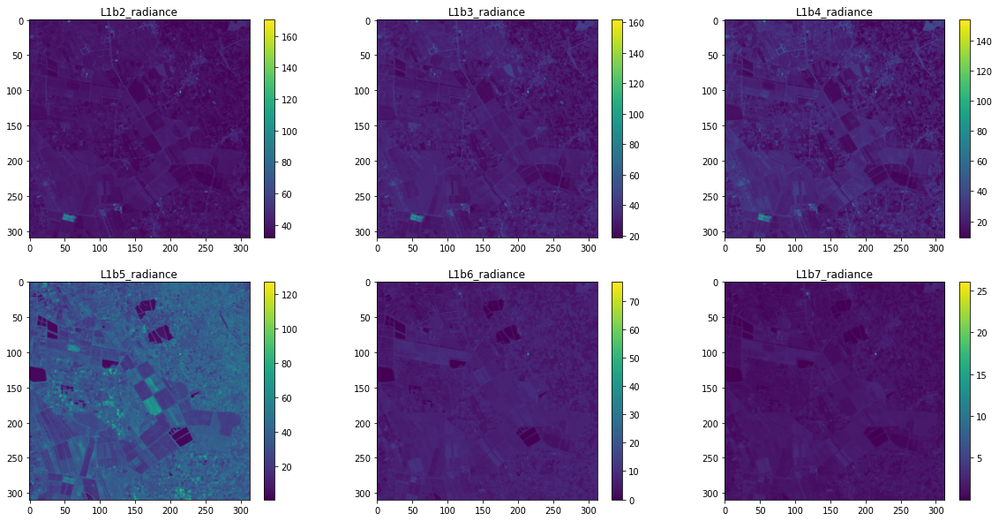

In [ ]:
l1_radinaces = [l1b2_radiance,l1b3_radiance,l1b4_radiance,l1b5_radiance,l1b6_radiance,l1b7_radiance]

fig, ax = plt.subplots(2, 3)
k = 0
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(l1_radinaces[k])
         ax[i, j].set_title('L1b' + str(k+2) + '_radiance')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

## Calculating the Reflectance raster from MTL file

https://www.usgs.gov/landsat-missions/using-usgs-landsat-level-1-data-product

Reflective band DN’s can be converted to TOA reflectance using the rescaling coefficients in the MTL file:  

$\rho_{\lambda}^{\prime}=M_{\rho} Q_{c a l}+A_{\rho}$

```
ρλ'   = TOA planetary reflectance, without correction for solar angle.  Note that ρλ' does not contain a correction for the sun angle.

Mρ=Band-specific multiplicative rescaling factor from the metadata (REFLECTANCE_MULT_BAND_x, where x is the band number)

Aρ  =Band-specific additive rescaling factor from the metadata (REFLECTANCE_ADD_BAND_x, where x is the band number)

Qcal =  Quantized and calibrated standard product pixel values (DN)
```

TOA reflectance with a correction for the sun angle is then:

$\rho_{\lambda}=\frac{\rho_{\lambda}^{\prime}}{\cos \left(\theta_{S Z}\right)}=\frac{\rho_{\lambda}^{\prime}}{\sin \left(\theta_{S E}\right)}$

where:

```
ρλ=  TOA planetary reflectance

θSE =  Local sun elevation angle. The scene center sun elevation angle in
degrees is provided in the metadata (SUN_ELEVATION).

θSZ =Local solar zenith angle;  θSZ = 90° - θSE
```

in the MTL we have:
```
    REFLECTANCE_MULT_BAND_1 = 2.0000E-05
    REFLECTANCE_MULT_BAND_2 = 2.0000E-05
    REFLECTANCE_MULT_BAND_3 = 2.0000E-05
    REFLECTANCE_MULT_BAND_4 = 2.0000E-05
    REFLECTANCE_MULT_BAND_5 = 2.0000E-05
    REFLECTANCE_MULT_BAND_6 = 2.0000E-05
    REFLECTANCE_MULT_BAND_7 = 2.0000E-05
    REFLECTANCE_MULT_BAND_8 = 2.0000E-05
    REFLECTANCE_MULT_BAND_9 = 2.0000E-05
    REFLECTANCE_ADD_BAND_1 = -0.100000
    REFLECTANCE_ADD_BAND_2 = -0.100000
    REFLECTANCE_ADD_BAND_3 = -0.100000
    REFLECTANCE_ADD_BAND_4 = -0.100000
    REFLECTANCE_ADD_BAND_5 = -0.100000
    REFLECTANCE_ADD_BAND_6 = -0.100000
    REFLECTANCE_ADD_BAND_7 = -0.100000
    REFLECTANCE_ADD_BAND_8 = -0.100000
    REFLECTANCE_ADD_BAND_9 = -0.100000
```
since all of them have the same values, we just use 2 variables to represent them all

In [ ]:
REFLECTANCE_MULT = 2.0000E-05
REFLECTANCE_ADD = -0.100000

from the header we have

`SUN_ELEVATION = 32.34575449`

In [ ]:
SUN_ELEVATION = 32.34575449

In [ ]:
def dn2reflectance(dn_raster,gain = REFLECTANCE_MULT, bias = REFLECTANCE_ADD,sun_elev =SUN_ELEVATION):
  reflectance = (gain*dn_raster + bias)/ np.sin(np.radians(sun_elev))
  return reflectance

In [ ]:
l1b2_reflectance = dn2reflectance(l1b2)
l1b3_reflectance = dn2reflectance(l1b3)
l1b4_reflectance = dn2reflectance(l1b4)
l1b5_reflectance = dn2reflectance(l1b5)
l1b6_reflectance = dn2reflectance(l1b6)
l1b7_reflectance = dn2reflectance(l1b7)

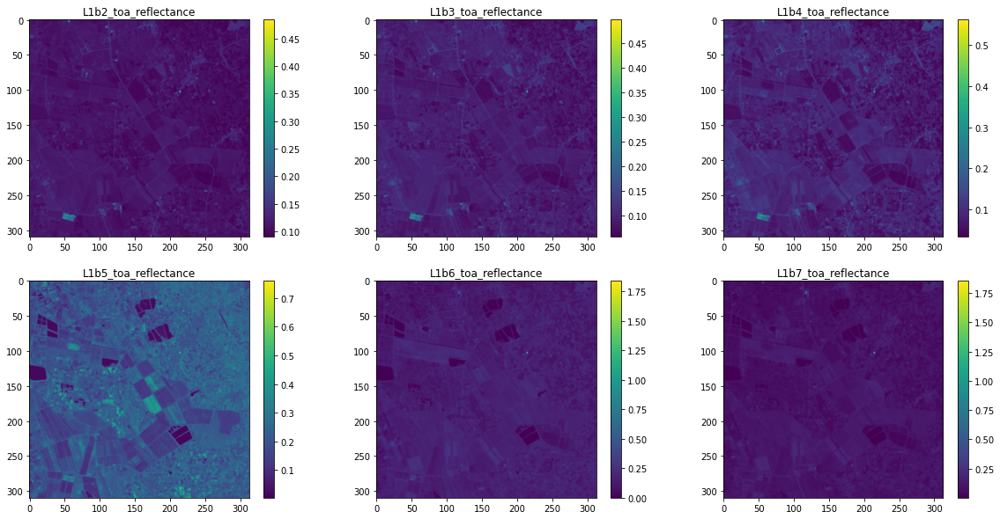

In [ ]:
l1_reflectances = [l1b2_reflectance,l1b3_reflectance,l1b4_reflectance,l1b5_reflectance,l1b6_reflectance,l1b7_reflectance]

fig, ax = plt.subplots(2, 3)
k = 0
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(l1_reflectances[k])
         ax[i, j].set_title('L1b' + str(k+2) + '_toa_reflectance')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

### Calculating the Reflectivity

$\rho_{\lambda}=\frac{\pi \cdot L_{\lambda}}{E S U N_{\lambda} \cdot \cos \theta \cdot d_{r}}$

$d_{r}=1+0.033 \cos \left(\operatorname{DOY} \frac{2 \pi}{365}\right)$

from the header file we have:
so we don't have to calculate dr since it is given in MTL file

In [ ]:
doy = 330
dr = 1 + 0.033 * np.cos((doy * np.pi * 2 )/ 365)
print(dr)

1.0271894591899993


In [ ]:
SUN_AZIMUTH = 160.81742061
SUN_ELEVATION = 32.34575449
EARTH_SUN_DISTANCE = 0.9884832

ok so we get the same `dr` resulats with both `EARTH_SUN_DISTANCE` in header and formula in SEBAL manual.

In [ ]:
dr = 1/EARTH_SUN_DISTANCE**2
print(dr)

1.0234377094419422


In [ ]:
incident_angle = 90 - SUN_ELEVATION # or zenith angle

In [ ]:
cos_teta = np.cos(np.radians(incident_angle))

#### landsat 8 ESUN vlues approximitly are:

https://www.gisagmaps.com/landsat-8-atco/

In [ ]:
esun2 = 2067
esun3 = 1893
esun4 = 1603
esun5 = 972.6
esun6 = 245.0
esun7 = 79.72

In [ ]:
def reflectivity_calculator(radiance_raster,ESUN,cos_teta =cos_teta,dr = dr):
  reflectivity = (np.pi * radiance_raster)/(ESUN * cos_teta * dr)
  return reflectivity

In [ ]:
l1b2_reflectivity = reflectivity_calculator(l1b2_radiance,esun2)
l1b3_reflectivity = reflectivity_calculator(l1b3_radiance,esun3)
l1b4_reflectivity = reflectivity_calculator(l1b4_radiance,esun4)
l1b5_reflectivity = reflectivity_calculator(l1b5_radiance,esun5)
l1b6_reflectivity = reflectivity_calculator(l1b6_radiance,esun6)
l1b7_reflectivity = reflectivity_calculator(l1b7_radiance,esun7)

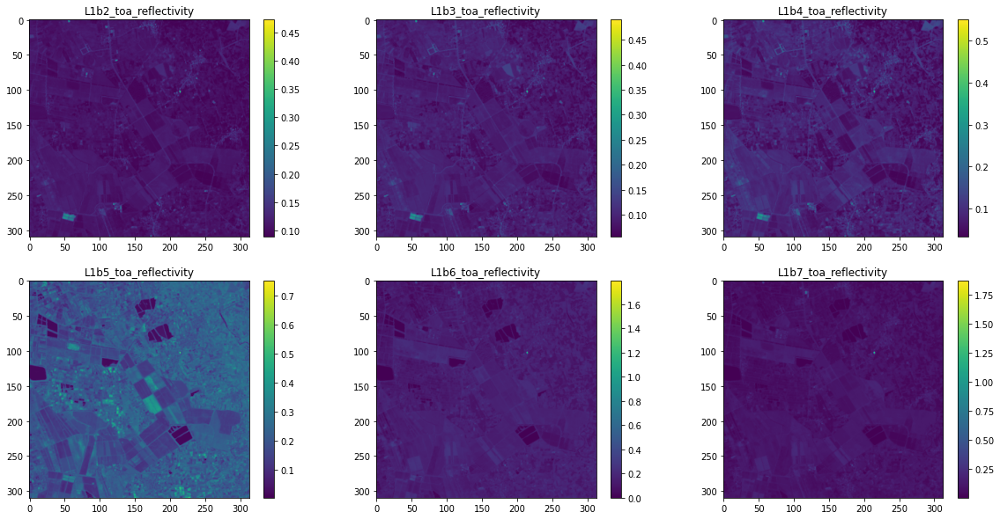

In [ ]:
l1_reflectivities = [l1b2_reflectivity,l1b3_reflectivity,l1b4_reflectivity,l1b5_reflectivity,l1b6_reflectivity,l1b7_reflectivity]

fig, ax = plt.subplots(2, 3)
k = 0
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(l1_reflectivities[k])
         ax[i, j].set_title('L1b' + str(k+2) + '_toa_reflectivity')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

## no diffrence between reflectance and reflectivity

so as we can see there's almost no diffrence between `relectance` calculated by USGS formula and `reflectivity` calcluated with the algorithm suggested in SEBAL handbook.

this suggests that  the ESUNs we used are correct and the `Reflectivity` mentioned in the SEBAL is in fact `Reflectence`

In [ ]:
ref_diff2=l1b2_reflectivity/l1b2_reflectance
ref_diff3=l1b3_reflectivity/l1b3_reflectance
ref_diff4=l1b4_reflectivity/l1b4_reflectance
ref_diff5=l1b5_reflectivity/l1b5_reflectance
ref_diff6=l1b6_reflectivity/l1b6_reflectance
ref_diff7=l1b7_reflectivity/l1b7_reflectance

In [ ]:
print(np.min(ref_diff2),np.mean(ref_diff2),np.max(ref_diff2))

0.9771158745335065 0.9771551312408691 0.9771669844660062


so as we can see the `reflectiviy` is exactly `0.97` times of `reflectance` (for band 2)

mind the le-5 in the plots so you don't get misslead that they are diffrent

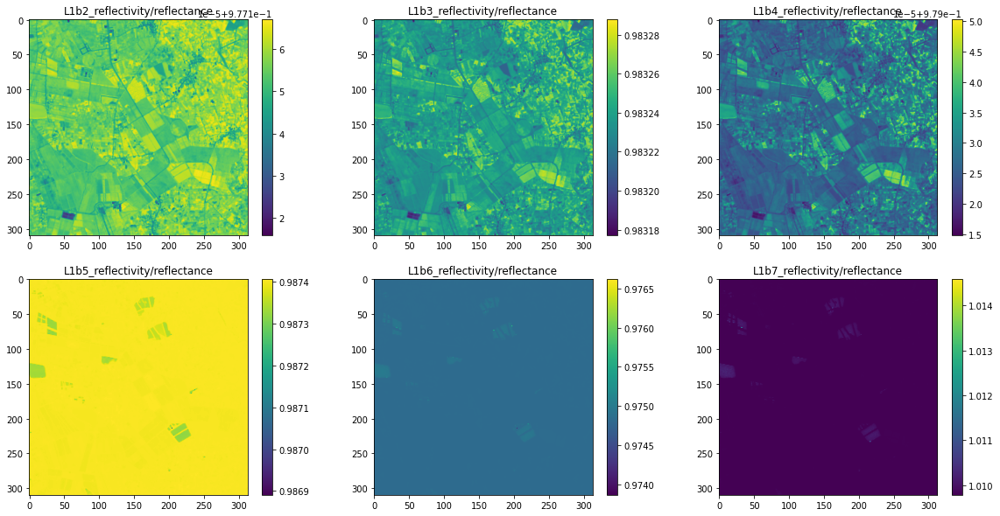

In [ ]:
l1_ref_diffs = [ref_diff2,ref_diff3,ref_diff4,ref_diff5,ref_diff6,ref_diff7]

fig, ax = plt.subplots(2, 3)
k = 0
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(l1_ref_diffs[k])
         ax[i, j].set_title('L1b' + str(k+2) + '_reflectivity/reflectance')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

## Calculating exactESUNs for our data
in comparision of the reflectevity and reflectance we proved that our ESUNs are `almost`correct but to calculate the exact amount for our scene we can do this:

paper:

`Procedures for calculation of the albedo with OLI-Landsat 8 images:
Application to the Brazilian semi-arid`

so we had:

$\rho_{\lambda}=\frac{\pi \cdot L_{\lambda}}{E S U N_{\lambda} \cdot \cos \theta \cdot d_{r}}$

to calculate ESUN we have

$E S U N_{\lambda}=\frac{\pi \cdot L_{\lambda}}{\rho_{\lambda} \cdot \cos \theta \cdot d_{r}}$

In [ ]:
def esun_calculator(radiance_raster,reflectance_raster,zenith_angle,dr):
  esun_raster = (np.pi*radiance_raster) / (reflectance_raster*np.cos(np.radians(zenith_angle))*dr)
  return np.mean(esun_raster)

In [ ]:
esun2 = esun_calculator(l1b2_radiance,l1b2_reflectance,incident_angle,dr)
esun3 = esun_calculator(l1b3_radiance,l1b3_reflectance,incident_angle,dr)
esun4 = esun_calculator(l1b4_radiance,l1b4_reflectance,incident_angle,dr)
esun5 = esun_calculator(l1b5_radiance,l1b5_reflectance,incident_angle,dr)
esun6 = esun_calculator(l1b6_radiance,l1b6_reflectance,incident_angle,dr)
esun7 = esun_calculator(l1b7_radiance,l1b7_reflectance,incident_angle,dr)

In [ ]:
print(esun2,
esun3,
esun4,
esun5,
esun6,
esun7)

2019.7796562748765 1861.2746436967318 1569.3829080742305 960.3460702960608 238.83526269500877 80.50105302300764


## Albedo Level 1

from sebal we have:

$\alpha_{\mathrm{toa}}=\Sigma\left(\omega_{\lambda} \times \rho_{\lambda}\right)$

$\omega_{\lambda}=\frac{E S U N_{\lambda}}{\sum E S U N_{\lambda}}$

In [ ]:
esuns = [esun2,esun3,esun4,esun5,esun6,esun7]
reflectances = [l1b2_reflectance,l1b3_reflectance,l1b4_reflectance,l1b5_reflectance,l1b6_reflectance,l1b7_reflectance]
esuns_sum = sum(esuns)
albedo_toa = np.zeros(l1b2_reflectance.shape)
for esun,ref in zip(esuns,reflectances):
  albedo_toa += (esun/esuns_sum)*ref
  print('esun weight',(esun/esuns_sum))


esun weight 0.30011051483506446
esun weight 0.276558925541162
esun weight 0.23318796733707178
esun weight 0.14269376002525627
esun weight 0.03548752133703651
esun weight 0.011961310924408955


In [ ]:
print(np.min(albedo_toa),np.mean(albedo_toa),np.max(albedo_toa))

0.0549717717676238 0.11481513819511377 0.6107861453267249


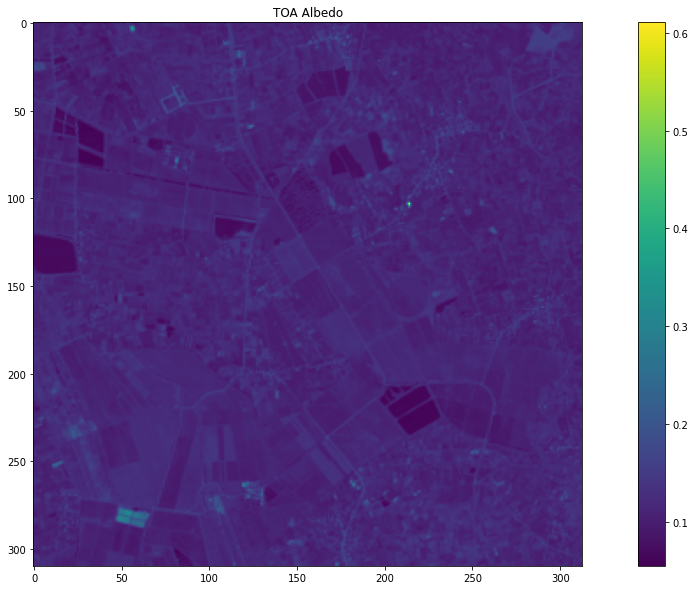

In [ ]:
plt.imshow(albedo_toa)
plt.title('TOA Albedo')
plt.colorbar()

### surface albedo form Level 1

$\alpha=\frac{\alpha_{\text {toa }}-\alpha_{\text {path_radiance }}}{\tau_{s w}^{2}}$

 "*Values for `αpath_radiance` range between 0.025 and 0.04 and for SEBAL we recommend a
value of `0.03` based on Bastiaanssen (2000).*"

τsw
is the atmospheric transmissivity.

$\tau_{\mathrm{sw}}=0.75+2 \times 10^{-5} \times \mathrm{z}$

where; `z` is the elevation above sea level (m).



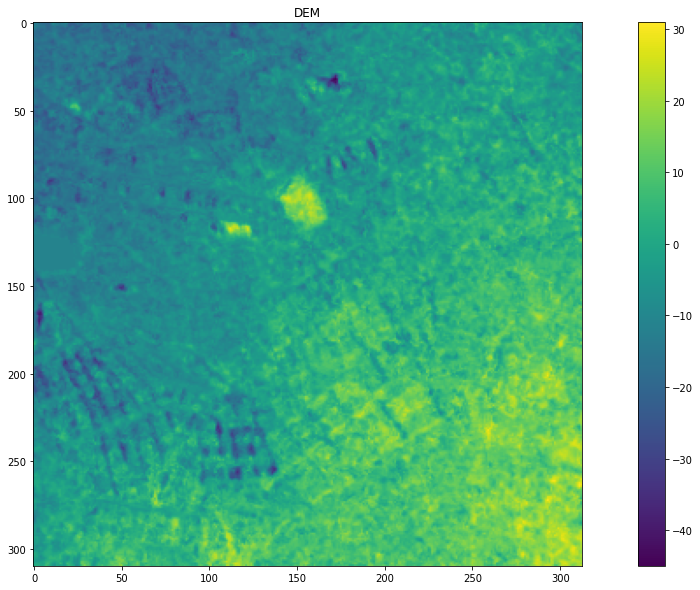

In [ ]:
plt.imshow(dem)
plt.title('DEM')
plt.colorbar()

In [ ]:
taw = 0.75 + 2E-5 * dem

#### atmospheric transmissivity

since our area is flat, it doesn't have a great effect on the reasults

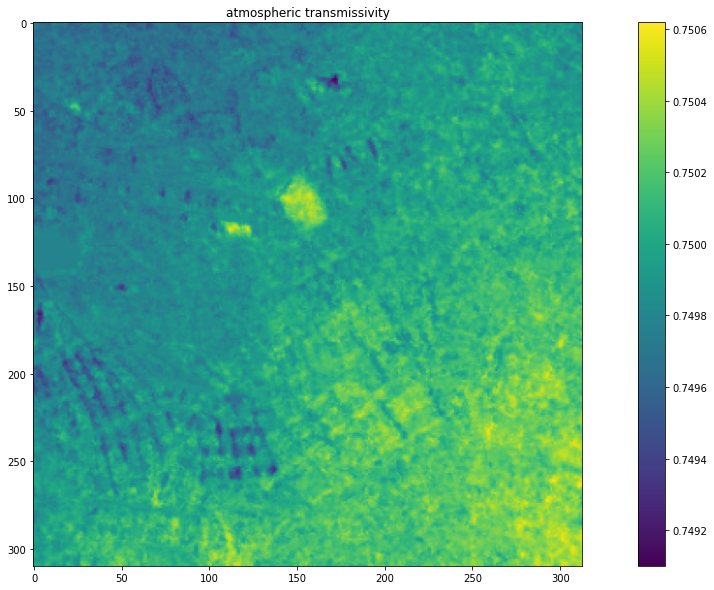

In [ ]:
plt.imshow(taw)
plt.title('atmospheric transmissivity')
plt.colorbar()

In [ ]:
l1_surface_albedo = (albedo_toa - 0.03)/taw**2

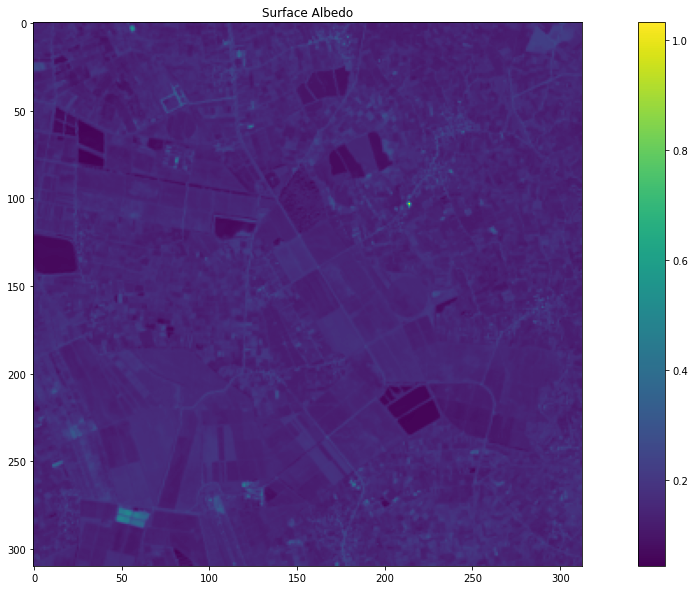

In [ ]:
plt.imshow(l1_surface_albedo)
plt.title('Surface Albedo')
plt.colorbar()

# Calculating ALbedo for C2 Level 2

In [ ]:
l2b2_dn = plt.imread('/content/subset/L2/LC08__L2_B2_cliped.tif')
l2b3_dn = plt.imread('/content/subset/L2/LC08__L2_B3_cliped.tif')
l2b4_dn = plt.imread('/content/subset/L2/LC08__L2_B4_cliped.tif')
l2b5_dn = plt.imread('/content/subset/L2/LC08__L2_B5_cliped.tif')
l2b6_dn = plt.imread('/content/subset/L2/LC08__L2_B6_cliped.tif')
l2b7_dn = plt.imread('/content/subset/L2/LC08__L2_B7_cliped.tif')

l2st_dn = plt.imread('/content/subset/L2/LC08__L2_ST_cliped.tif')

l2atran_dn = plt.imread('/content/subset/L2/LC08__L2_atran_cliped.tif')
l2drad_dn = plt.imread('/content/subset/L2/LC08__L2_drad_cliped.tif')
l2emis_dn = plt.imread('/content/subset/L2/LC08__L2_emis_cliped.tif')
l2urad_dn = plt.imread('/content/subset/L2/LC08__L2_urad_cliped.tif')




(310, 313, 3)


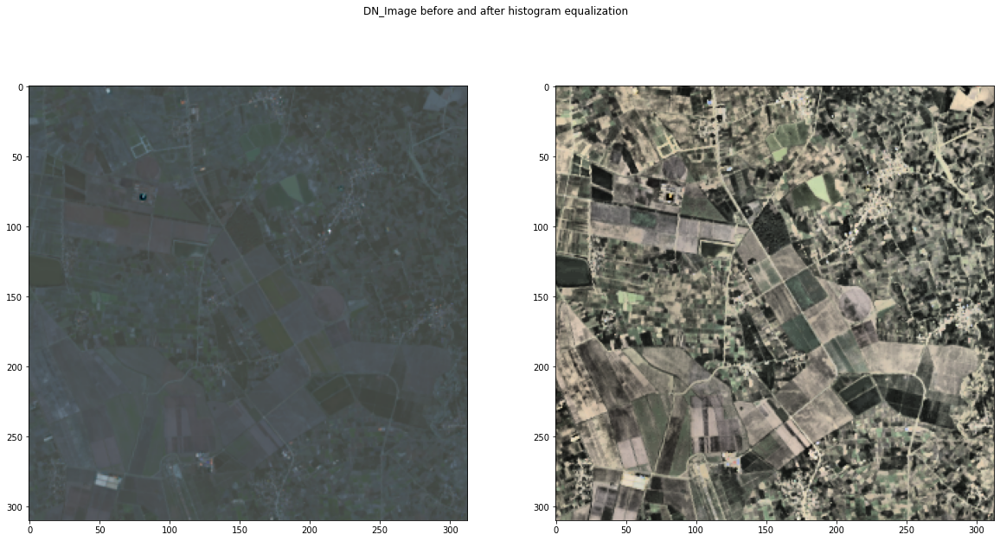

In [ ]:
im , stretched = stack_3_channel(l2b2_dn,l2b3_dn,l2b4_dn, clipLimit = 10 ,  tileGridSize=(8,8) )
print(stretched.shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('DN_Image before and after histogram equalization')
ax1.imshow(im)
ax2.imshow(stretched)


[How do I use a scale factor with Landsat Level-2 science products?](https://www.usgs.gov/faqs/how-do-i-use-scale-factor-landsat-level-2-science-products#:~:text=Landsat%20Collection%202%20surface%20temperature,offset%20of%20149.0%20per%20pixel.)

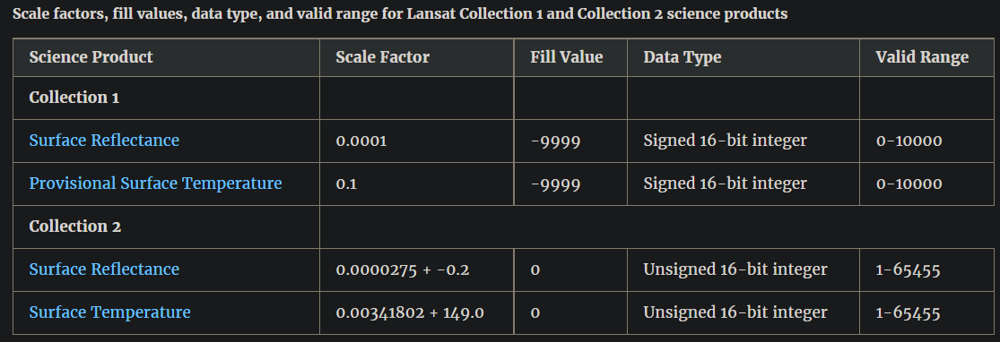

In [ ]:
l2b2= l2b2_dn*0.0000275 + -0.2
l2b3= l2b3_dn*0.0000275 + -0.2
l2b4= l2b4_dn*0.0000275 + -0.2
l2b5= l2b5_dn*0.0000275 + -0.2
l2b6= l2b6_dn*0.0000275 + -0.2
l2b7= l2b7_dn*0.0000275 + -0.2

values belew zero are invalid so we convert them in to zero

In [ ]:
l2b2[l2b2<0] = 0
l2b3[l2b3<0] = 0
l2b4[l2b4<0] = 0
l2b5[l2b5<0] = 0
l2b6[l2b6<0] = 0
l2b7[l2b7<0] = 0

we can see that this converting to reflectance (it is because of the subtracting bias value) highly increases the contrast

(310, 313, 3)


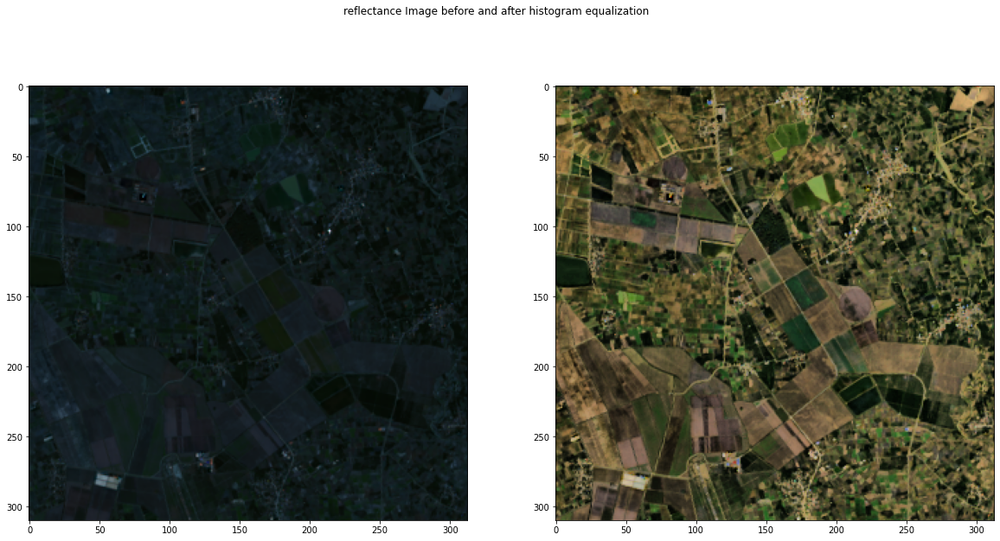

In [ ]:
im , stretched = stack_3_channel(l2b2,l2b3,l2b4, clipLimit = 5 ,  tileGridSize=(8,8) )
print(stretched.shape)
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('reflectance Image before and after histogram equalization')
ax1.imshow(im)
ax2.imshow(stretched)

### this is the surface reflectance

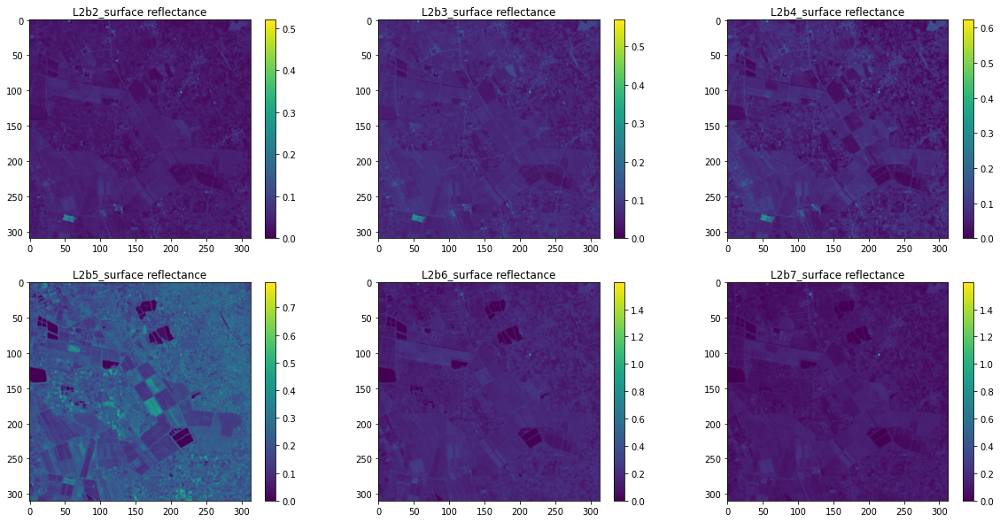

In [ ]:
l2_surface_reflectances = [l2b2,l2b3,l2b4,l2b5,l2b6,l2b7]

fig, ax = plt.subplots(2, 3)
k = 0
for i in range(2):
    for j in range(3):

         im = ax[i, j].imshow(l2_surface_reflectances[k])
         ax[i, j].set_title('L2b' + str(k+2) + '_surface reflectance')
         plt.colorbar(im, ax=ax[i, j])
         k += 1
plt.show()

### albedo from Level 2 Data - considerting esun weight

In [ ]:
esuns = [esun2,esun3,esun4,esun5,esun6,esun7]
l2_reflectances = [l2b2,l2b3,l2b4,l2b5,l2b6,l2b7]
esuns_sum = sum(esuns)
l2_albedo_surface = np.zeros(l2b2.shape)
for esun,ref in zip(esuns,l2_reflectances):
  l2_albedo_surface += (esun/esuns_sum)*ref


### albedo

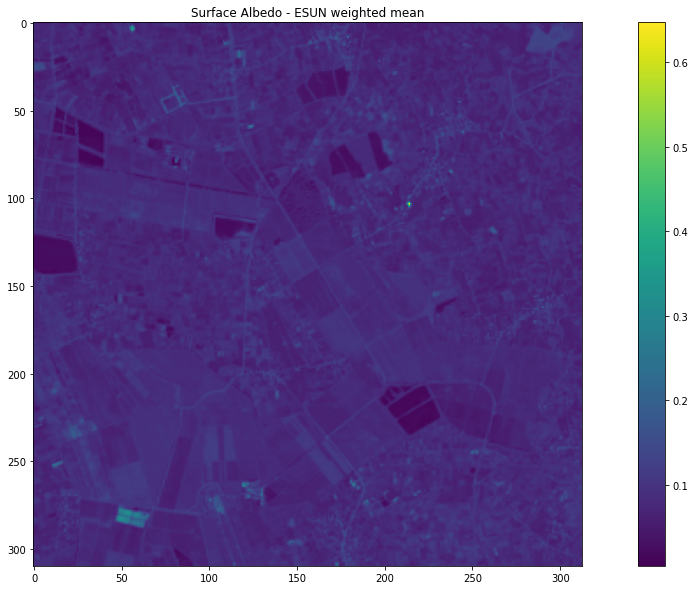

In [ ]:
plt.imshow(l2_albedo_surface)
plt.title('Surface Albedo - ESUN weighted mean')
plt.colorbar()

### albedo from Level 2 Data - NOT considerting esun weight
We just take the mean of reflectance values

In [ ]:
l2_surface_albedo_mean  = sum(l2_reflectances)/len(l2_reflectances)

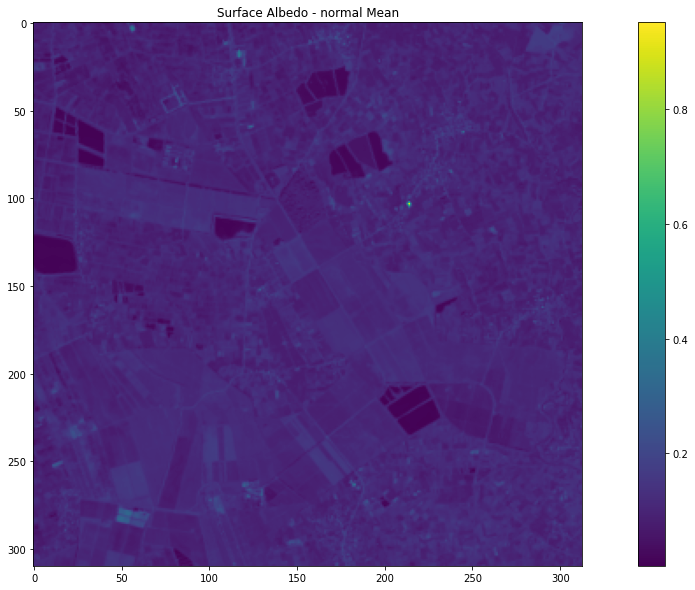

In [ ]:
plt.imshow(l2_surface_albedo_mean)
plt.title('Surface Albedo - normal Mean')
plt.colorbar()

## Final reasults

# Diffrence between L1 and L2 albedos

final reaults show that for level 2 if don't use ESUN weighted summaitoion and just mean over the reflectences the surface albedo from Leve1 and Level 2 are the most similiar. but we shall not do that becaue even we get more similar resault we are ommiting the waighs and it is not phiscily and mathematicaly the right thing to do, so we accept this 2%  more error just to be right!

In [ ]:
# albedo_diff = l1_surface_albedo -l2_surface_albedo_mean
albedo_diff = l1_surface_albedo -l2_albedo_surface

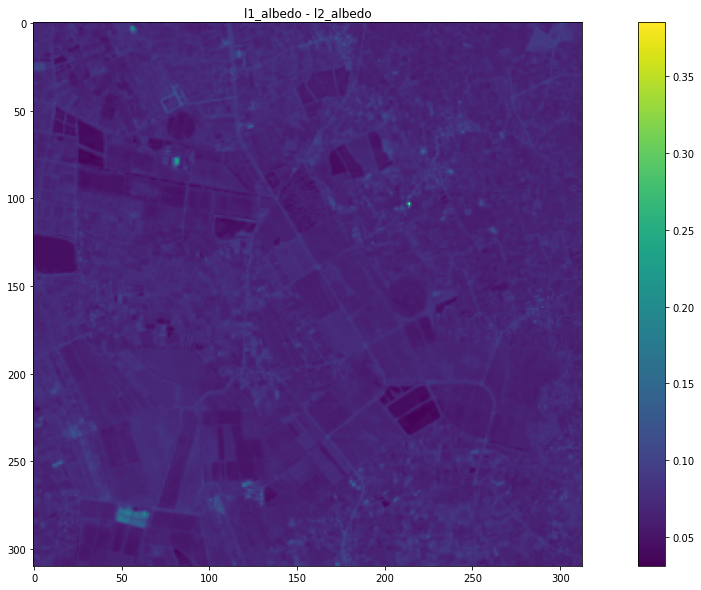

In [ ]:
plt.imshow(albedo_diff)
plt.title('l1_albedo - l2_albedo')
plt.colorbar()

In [ ]:
np.mean(albedo_diff)

0.06918184208785823

(array([[ 54., 254.,   2., ...,   0.,   0.,   0.],
        [ 60., 248.,   2., ...,   0.,   0.,   0.],
        [ 66., 242.,   2., ...,   0.,   0.,   0.],
        ...,
        [117., 193.,   0., ...,   0.,   0.,   0.],
        [116., 194.,   0., ...,   0.,   0.,   0.],
        [125., 185.,   0., ...,   0.,   0.,   0.]]),
 array([0.03142247, 0.06678019, 0.1021379 , 0.13749562, 0.17285334,
        0.20821106, 0.24356877, 0.27892649, 0.31428421, 0.34964193,
        0.38499964]),
 <a list of 313 Lists of Patches objects>)

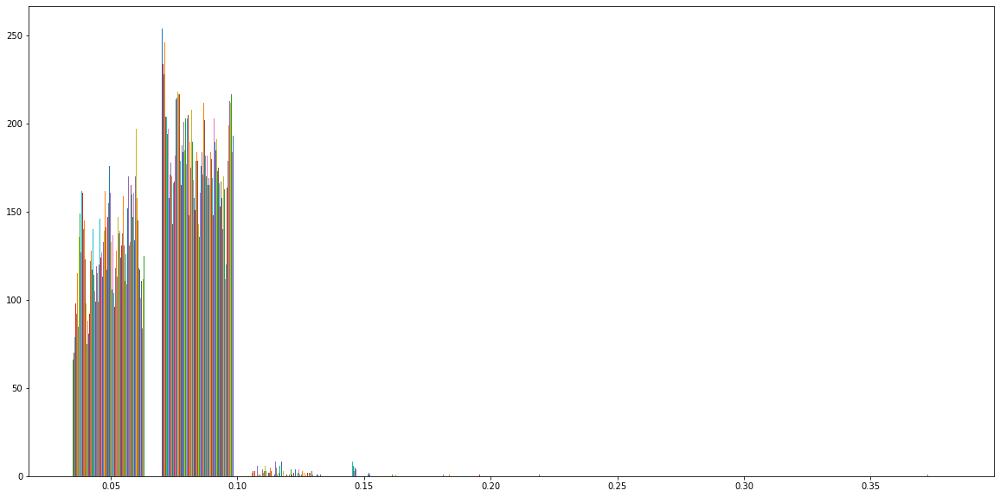

In [ ]:
plt.hist(albedo_diff)